<a href="https://colab.research.google.com/github/alenready/ML_AI_ICT-Assignments/blob/main/Theta_ICTprj_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Project Report: AI-Powered Food Ordering Chatbot
dataset_link: https://drive.google.com/file/d/1E4EZEoipj05sPePPns1CASei0fbSEmpS/view?usp=sharing

1. Introduction
The advancement of artificial intelligence (AI) has revolutionized various industries, including the food industry. This project aims to develop an AI-powered food ordering chatbot that leverages Natural Language Processing (NLP), restaurant databases, Google Maps API,  deployment, and secure payment integration. Additionally, image detection capabilities may be incorporated to enhance food recommendations.

2. Objectives

Develop a chatbot that can efficiently handle food orders via NLP.

Integrate a restaurant database for menu retrieval and order processing.

Utilize Google Maps API to locate nearby restaurants and provide delivery options.

Deploy the chatbot on Telegram for easy accessibility.

Ensure secure payment integration for seamless transactions.

Enhance user experience with image-based food recognition.

3. Dataset Description
The dataset used for training the chatbot consists of:

Restaurant Data: Includes restaurant names, locations, cuisines, menu items, prices, and availability.

User Queries: A collection of user interactions related to food ordering, categorized into intents (e.g., order food, ask for recommendations, inquire about delivery times, etc.).

Food Images Dataset (Optional): A set of labeled images used to train an image recognition model for food item identification.

4. Methodology

Natural Language Processing (NLP):

Use NLP models to process and understand user queries.

Implement intent detection and entity recognition.

Train models using labeled datasets of food-related conversations.

Chatbot Development:

Build a conversational AI model using frameworks like Dialogflow, Rasa, or custom NLP models.

Implement contextual conversation handling.

Restaurant Database Integration:

Store and retrieve restaurant information dynamically.

Google Maps API Integration:

Enable location-based restaurant search.

Provide estimated delivery times.

Bot Deployment:

Use Telegram Bot API for chatbot deployment.

Ensure a user-friendly interface.

Payment Gateway Integration:

Secure transactions using APIs like Stripe, PayPal, or Razorpay.

Implement encryption for security.

Image-Based Food Recommendation (Optional):

Train a convolutional neural network (CNN) model for food recognition.

Provide recommendations based on detected food items.

5. Expected Outcomes

A fully functional AI-powered chatbot capable of handling food orders.

Improved user experience with seamless interactions and accurate responses.

Efficient restaurant search and delivery estimation using Google Maps API.

Secure and hassle-free payment processing.

Enhanced recommendations with optional image detection features.

6. Conclusion
This project integrates AI-driven chatbot technology with restaurant databases, mapping services, and payment gateways to streamline the food ordering experience. The successful implementation of this chatbot will provide users with a convenient, intelligent, and interactive ordering system, potentially transforming the food industry.

In [92]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn


In [ ]:
#  read the dataset

df = pd.read_excel('/content/Theta_bot.xlsx')
print(df.head())


   Unnamed: 0  restaurant_id           category  \
0           0              1  Extra Large Pizza   
1           1              1  Extra Large Pizza   
2           2              1  Extra Large Pizza   
3           3              1  Extra Large Pizza   
4           4              1  Extra Large Pizza   

                                  name description      price  \
0              Extra Large Meat Lovers  Whole pie.  15.99 USD   
1                  Extra Large Supreme  Whole pie.  15.99 USD   
2                Extra Large Pepperoni  Whole pie.  14.99 USD   
3  Extra Large BBQ Chicken &amp; Bacon   Whole Pie  15.99 USD   
4                 Extra Large 5 Cheese  Whole pie.  14.99 USD   

                                              Review  Rating  index  \
0  nice hotel expensive parking got good deal sta...       4      0   
1  ok nothing special charge diamond member hilto...       2      1   
2  nice rooms not 4* experience hotel monaco seat...       3      2   
3  unique, great s

In [93]:
# df copy

df_copy = df.copy()



In [ ]:
df.size

22000

In [ ]:
df.info

<bound method DataFrame.info of      Unnamed: 0  restaurant_id           category  \
0             0              1  Extra Large Pizza   
1             1              1  Extra Large Pizza   
2             2              1  Extra Large Pizza   
3             3              1  Extra Large Pizza   
4             4              1  Extra Large Pizza   
..          ...            ...                ...   
995         995             21    Shakes - Fruity   
996         996             21    Shakes - Fruity   
997         997             21    Shakes - Fruity   
998         998             21    Shakes - Fruity   
999         999             21    Shakes - Fruity   

                                    name  \
0                Extra Large Meat Lovers   
1                    Extra Large Supreme   
2                  Extra Large Pepperoni   
3    Extra Large BBQ Chicken &amp; Bacon   
4                   Extra Large 5 Cheese   
..                                   ...   
995                   Cap'n Crunch Shake   
996                      PB Banana Shake   
997                   Banana Bread Shake   
998              Strawberry Banana Shake   
999                 Banana Caramel Shake   

                                           description      price  \
0                                           Whole pie.  15.99 USD   
1                                           Whole pie.  15.99 USD   
2                                           Whole pie.  14.99 USD   
3                                            Whole Pie  15.99 USD   
4                                           Whole pie.  14.99 USD   
..                                                 ...        ...   
995  200 to 250 calories, 24 to 32 grams protein, 1...    8.5 USD   
996  200 to 250 calories, 24 to 32 grams protein, 1...    8.5 USD   
997  200 to 250 calories, 24 to 32 grams protein, 1...    8.5 USD   
998  200 to 250 calories, 24 to 32 grams protein, 1...    8.5 USD   
999  200 to 250 calories, 24 to 32 grams protein, 1...    8.5 USD   

                                                Review  Rating  index  \
0    nice hotel expensive parking got good deal sta...       4      0   
1    ok nothing special charge diamond member hilto...       2      1   
2    nice rooms not 4* experience hotel monaco seat...       3      2   
3    unique, great stay, wonderful time hotel monac...       5      3   
4    great stay great stay, went seahawk game aweso...       5      4   
..                                                 ...     ...    ...   
995  average price hotel good location 1.5 blocks u...       3    995   
996  good customer service recently wrote dissatisf...       4    996   
997  ignore bad press just post review reading nega...       4    997   
998  business trip ok hotel fine evening business, ...       3    998   
999  okay downstairs medicore room overrated overpr...       3    999   

                                  city  ...  \
0                       Alexander City  ...   
1                          Albertville  ...   
2                       Alexander City  ...   
3                          Albertville  ...   
4                       Alexander City  ...   
..                                 ...  ...   
995                         Birmingham  ...   
996  3321 Lorna Rd Birmingham AL 35216  ...   
997                         Birmingham  ...   
998                             Hoover  ...   
999                             Hoover  ...   

                                               address  \
0       4097 U S Highway 280, Alexander City, AL 35010   
1            7300 Hwy 431 North, Albertville, AL 35951   
2        4097 Us Highway 280, Alexander City, AL 35010   
3               7959 Us Hwy 431, Albertville, AL 35950   
4           977 Jefferson St, Alexander City, AL 35010   
..                                                 ...   
995  2101 Richard Arrington Jr Blvd S, Birmingham, ...   
996                  3321 Lorna Rd Birmingham AL 35216   
997  1024

In [ ]:
df.describe()

,Unnamed: 0,restaurant_id,Rating,index,latitude,longitude,delivery_fee,scan_date,TID
count,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,3.00,1000,1000.000000
mean,499.500000,10.515000,3.65100,499.500000,33.326419,-86.625070,3.99,2022-11-09 18:03:42.999999744,500.500000
min,0.000000,1.000000,1.00000,0.000000,30.398450,-88.248540,2.49,2022-11-09 18:03:43,1.000000
25%,249.750000,5.000000,3.00000,249.750000,33.376806,-86.819204,3.24,2022-11-09 18:03:43,250.750000
50%,499.500000,11.000000,4.00000,499.500000,33.481640,-86.793128,3.99,2022-11-09 18:03:43,500.500000
75%,749.250000,14.000000,5.00000,749.250000,33.563345,-86.648350,4.74,2022-11-09 18:03:43,750.250000
max,999.000000,21.000000,5.00000,999.000000,34.991740,-85.236110,5.49,2022-11-09 18:03:43,1000.000000
std,288.819436,6.252589,1.33153,288.819436,0.742832,0.467732,1.50,NaN,288.819436


In [ ]:
df.columns

Index(['Unnamed: 0', 'restaurant_id', 'category', 'name', 'description',
       'price', 'Review', 'Rating', 'index', 'city', 'state', 'zipcode',
       'address', 'loc_name', 'loc_number', 'latitude', 'longitude', 'is_open',
       'closed_message', 'delivery_fee', 'scan_date', 'TID'],
      dtype='object')

In [ ]:
# rows and column number

print("Number of rows:", len(df))
print("Number of columns:", len(df.columns))


Number of rows: 1000
Number of columns: 22


In [ ]:
# Check for null values
print(df.isnull().sum())

Unnamed: 0          0
restaurant_id       0
category            0
name                0
description       144
price               0
Review              0
Rating              0
index               0
city                1
state               0
zipcode             3
address             0
loc_name            0
loc_number          0
latitude            0
longitude           0
is_open             0
closed_message     14
delivery_fee      997
scan_date           0
TID                 0
dtype: int64


In [ ]:
print(df.tail(25))

     Unnamed: 0  restaurant_id          category  \
975         975             21  Shakes - Vanilla   
976         976             21  Shakes - Vanilla   
977         977             21  Shakes - Vanilla   
978         978             21  Shakes - Vanilla   
979         979             21  Shakes - Vanilla   
980         980             21  Shakes - Vanilla   
981         981             21  Shakes - Vanilla   
982         982             21  Shakes - Vanilla   
983         983             21  Shakes - Vanilla   
984         984             21  Shakes - Vanilla   
985         985             21  Shakes - Vanilla   
986         986             21  Shakes - Vanilla   
987         987             21   Shakes - Fruity   
988         988             21   Shakes - Fruity   
989         989             21   Shakes - Fruity   
990         990             21   Shakes - Fruity   
991         991             21   Shakes - Fruity   
992         992             21   Shakes - Fruity   
993         

In [ ]:
# remove columns name Unnamed: 0 , index and delivery_fee


# Remove columns
df = df.drop(columns=['Unnamed: 0', 'index', 'delivery_fee'], errors='ignore')
print(df.head())


   restaurant_id           category                                 name  \
0              1  Extra Large Pizza              Extra Large Meat Lovers   
1              1  Extra Large Pizza                  Extra Large Supreme   
2              1  Extra Large Pizza                Extra Large Pepperoni   
3              1  Extra Large Pizza  Extra Large BBQ Chicken &amp; Bacon   
4              1  Extra Large Pizza                 Extra Large 5 Cheese   

  description      price                                             Review  \
0  Whole pie.  15.99 USD  nice hotel expensive parking got good deal sta...   
1  Whole pie.  15.99 USD  ok nothing special charge diamond member hilto...   
2  Whole pie.  14.99 USD  nice rooms not 4* experience hotel monaco seat...   
3   Whole Pie  15.99 USD  unique, great stay, wonderful time hotel monac...   
4  Whole pie.  14.99 USD  great stay great stay, went seahawk game aweso...   

   Rating            city state zipcode  \
0       4  Alexander City

In [ ]:
# fill missing values in description column


# Fill missing values in the 'description' column with "No description available"
df['description'].fillna("No description available", inplace=True)


In [ ]:
# prompt: fill missing values in closed_message , city and zipcode

df['closed_message'].fillna("No message available", inplace=True)
df['city'].fillna("Unknown", inplace=True)


print(df.isnull().sum()) # Check if missing values are filled


restaurant_id     0
category          0
name              0
description       0
price             0
Review            0
Rating            0
city              0
state             0
zipcode           3
address           0
loc_name          0
loc_number        0
latitude          0
longitude         0
is_open           0
closed_message    0
scan_date         0
TID               0
dtype: int64


In [ ]:
# prompt: show the missing zipcode rows

# Display rows with missing zipcodes
missing_zipcodes = df[df['zipcode'].isnull()]
missing_zipcodes


,restaurant_id,category,name,description,price,Review,Rating,city,state,zipcode,address,loc_name,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID
125,2,Teas,Matcha Mint Chip Cafe Essential,Specialty drinks.,5.5 USD,"wonderful hotel, just spent nights mayflower p...",5,3083 Montgomery Highway Dothan,AL,NaN,"3083 Montgomery Highway Dothan, AL",It's Just Wings (3083 Montgomery Highway),8f879b6b-ec61-5e9d-af6d-8b9d6dbb7ce4,31.25078,-85.42848,False,Available at 11:00 AM,2022-11-09 18:03:43,126
347,7,Hot Dishes,Beef Wrapped Asparagus,"Kobe beef, asparagus, Japanese BBQ sauce.",19.0 USD,"single traveler 1. cheap- pay for.2, easy conv...",3,2000 Center Point Parkway Center Point,AL,NaN,"2000 Center Point Parkway Center Point, AL",CVS (2000 Center Point Parkway),d90b5925-695d-5112-a92a-1493e6298ae2,33.63867,-86.68410,False,Opens at 9:00 AM,2022-11-09 18:03:43,348
441,9,Sides,Broccoli,Tender broccoli florets steamed to order.,2.49 USD,"amazing staff small cute, say friendliest hote...",5,209 41st St S Birmingham,AL,NaN,"209 41st St S Birmingham, AL",Post Office Pies (Avondale),2ecc631f-5d33-5903-b437-a9a4479fee41,33.52467,-86.77390,False,Opens at 2:00 PM,2022-11-09 18:03:43,442


In [ ]:
# fill the missing zipcode as following orders 36303, 35215, 35222 with real time data


zipcodes = [36303, 35215, 35222]
for i in range(len(df)):
    if pd.isnull(df.loc[i, 'zipcode']):
        df.loc[i, 'zipcode'] = zipcodes[i % len(zipcodes)]  # Cycle through zipcodes

print(df.isnull().sum()) # Check if missing values are filled




restaurant_id     0
category          0
name              0
description       0
price             0
Review            0
Rating            0
city              0
state             0
zipcode           0
address           0
loc_name          0
loc_number        0
latitude          0
longitude         0
is_open           0
closed_message    0
scan_date         0
TID               0
dtype: int64


,restaurant_id,category,name,description,price,Review,Rating,city,state,zipcode,address,loc_name,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID


In [ ]:
print(df.isna().sum())

restaurant_id     0
category          0
name              0
description       0
price             0
Review            0
Rating            0
city              0
state             0
zipcode           0
address           0
loc_name          0
loc_number        0
latitude          0
longitude         0
is_open           0
closed_message    0
scan_date         0
TID               0
dtype: int64


In [ ]:
df.duplicated().sum()

In [ ]:
#  download new df as theta_new

from google.colab import files
df.to_csv('theta_new.csv', encoding = 'utf-8-sig')
files.download('theta_new.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [94]:

import pandas as pd

df2 = pd.read_csv('/content/theta_new.csv')
print(df.head())


   Unnamed: 0  restaurant_id           category  \
0           0              1  Extra Large Pizza   
1           1              1  Extra Large Pizza   
2           2              1  Extra Large Pizza   
3           3              1  Extra Large Pizza   
4           4              1  Extra Large Pizza   

                                  name description      price  \
0              Extra Large Meat Lovers  Whole pie.  15.99 USD   
1                  Extra Large Supreme  Whole pie.  15.99 USD   
2                Extra Large Pepperoni  Whole pie.  14.99 USD   
3  Extra Large BBQ Chicken &amp; Bacon   Whole Pie  15.99 USD   
4                 Extra Large 5 Cheese  Whole pie.  14.99 USD   

                                              Review  Rating            city  \
0  nice hotel expensive parking got good deal sta...       4  Alexander City   
1  ok nothing special charge diamond member hilto...       2     Albertville   
2  nice rooms not 4* experience hotel monaco seat...       3  

In [95]:
df2.duplicated().sum()

0

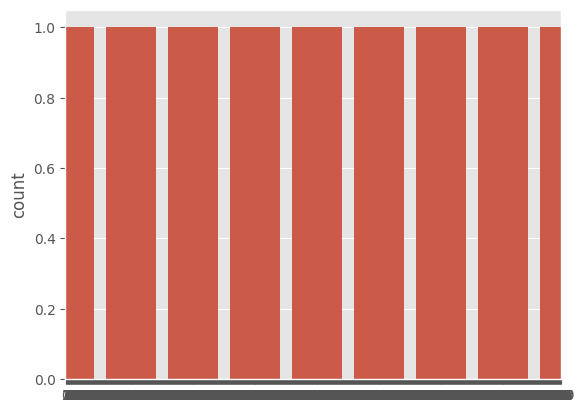

In [96]:
# how much percentage rating in the dataset

sns.countplot(df2['Rating'])
plt.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 148 (\x94) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 143 (\x8f) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 145 (\x91) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 150 (\x96) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 157 (\x9d) missing from font(s) DejaVu Sans.



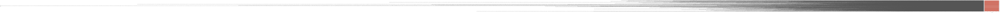

In [97]:
sns.countplot(df2['Review'])
plt.show()

Minimum rating: 1
Maximum rating: 5
Range of ratings: 1 to 5


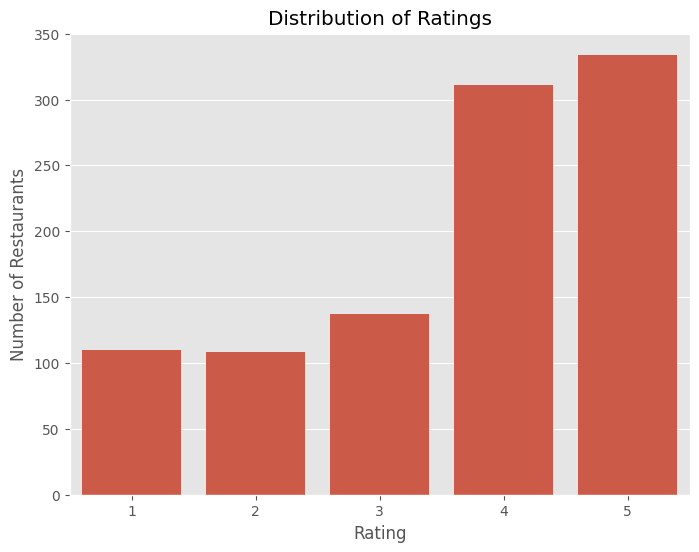

In [98]:
#  analyse the total  number of reviews and the range of ratings score


# Range of rating scores
min_rating = df2['Rating'].min()
max_rating = df2['Rating'].max()
print(f"Minimum rating: {min_rating}")
print(f"Maximum rating: {max_rating}")
print(f"Range of ratings: {min_rating} to {max_rating}")

# Visualization
plt.figure(figsize=(8, 6))
sns.countplot(x='Rating', data=df2)
plt.title('Distribution of Ratings')
plt.xlabel('Rating')
plt.ylabel('Number of Restaurants')
plt.show()



In [99]:
# Count non-empty review comments
total_reviews = df2['Review'].dropna().astype(str).apply(lambda x: x.strip()).replace('', np.nan).count()

print("Total number of review comments:", total_reviews)


Total number of review comments: 1000


In [100]:
# Length of word in sentence
df2['Length'] = df2['Review'].apply(len)
df.head()

,Unnamed: 0,restaurant_id,category,name,description,price,Review,Rating,city,state,...,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID,Length,clean_word,Length 2
0,0,1,Extra Large Pizza,Extra Large Meat Lovers,Whole pie.,15.99 USD,nice hotel expensive parking got good deal sta...,4,Alexander City,AL,...,0623b7ac-598d-5016-bdd2-febb44d79b12,32.923880,-85.95965,False,Opens at 11:00 AM,2022-11-09 18:03:43,1,593,nice hotel expens park got good deal stay hote...,481
1,1,1,Extra Large Pizza,Extra Large Supreme,Whole pie.,15.99 USD,ok nothing special charge diamond member hilto...,2,Albertville,AL,...,62a60773-5644-4d73-b969-a4922ce70fa6,34.277260,-86.20611,True,No message available,2022-11-09 18:03:43,2,1689,ok noth special charg diamond member hilton de...,1407
2,2,1,Extra Large Pizza,Extra Large Pepperoni,Whole pie.,14.99 USD,nice rooms not 4* experience hotel monaco seat...,3,Alexander City,AL,...,308b1654-60f1-51d4-bfe2-ed7c849442ac,32.923880,-85.95965,False,Opens at 11:00 AM,2022-11-09 18:03:43,3,1427,nice room experi hotel monaco seattl good hote...,1174
3,3,1,Extra Large Pizza,Extra Large BBQ Chicken &amp; Bacon,Whole Pie,15.99 USD,"unique, great stay, wonderful time hotel monac...",5,Albertville,AL,...,ef86513f-3973-4315-b938-bb6f230c5c58,34.280000,-86.21703,True,No message available,2022-11-09 18:03:43,4,600,uniqu great stay wonder time hotel monaco loca...,506
4,4,1,Extra Large Pizza,Extra Large 5 Cheese,Whole pie.,14.99 USD,"great stay great stay, went seahawk game aweso...",5,Alexander City,AL,...,9507eb1b-5afc-4ee1-a566-526d9e2ba2d0,32.956127,-85.94433,False,Opens at 11:00 AM,2022-11-09 18:03:43,5,1281,great stay great stay went seahawk game awesom...,1058


In [101]:
df2["Length"].describe().round(2)

,Length
count,1000.00
mean,585.98
std,417.95
min,47.00
25%,316.75
50%,474.00
75%,748.25
max,4599.00


<Axes: xlabel='Rating', ylabel='Length'>

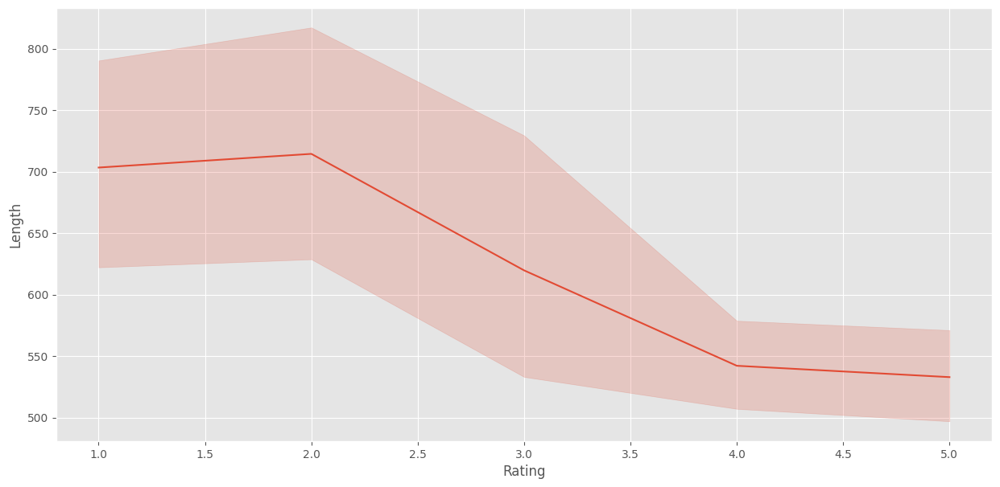

In [102]:
# graph what the the relationship between Rating and Length

plt.figure(figsize=(15,7))
sns.lineplot(data=df2,x="Rating", y="Length")

In [23]:
import plotly.express as px

# create the scatter plot:
px.scatter(df2,x="Rating",y="Length", color="Rating")

## we can see the length reviews has effect in the rating

In [26]:
df_5=df2[df2["Rating"]==5]
df_5

,Unnamed: 0,restaurant_id,category,name,description,price,Review,Rating,city,state,...,address,loc_name,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID,Length
3,3,1,Extra Large Pizza,Extra Large BBQ Chicken &amp; Bacon,Whole Pie,15.99 USD,"unique, great stay, wonderful time hotel monac...",5,Albertville,AL,...,"7959 Us Hwy 431, Albertville, AL 35950",Taco Bell (7959 Us Highway 431),ef86513f-3973-4315-b938-bb6f230c5c58,34.280000,-86.217030,True,No message available,2022-11-09 18:03:43,4,600
4,4,1,Extra Large Pizza,Extra Large 5 Cheese,Whole pie.,14.99 USD,"great stay great stay, went seahawk game aweso...",5,Alexander City,AL,...,"977 Jefferson St, Alexander City, AL 35010",The Station,9507eb1b-5afc-4ee1-a566-526d9e2ba2d0,32.956127,-85.944330,False,Opens at 11:00 AM,2022-11-09 18:03:43,5,1281
5,5,1,Extra Large Pizza,Extra Large Pepperoni Slice,Slice.,3.99 USD,love monaco staff husband stayed hotel crazy w...,5,Albertville,AL,...,"7375 Hwy 431, Albertville, AL 35950",McDonald's (7375 Hwy 431),aad1fb1b-72ea-4c3d-a8b0-6f54cdba1773,34.276520,-86.207740,True,No message available,2022-11-09 18:03:43,6,1002
6,6,1,Extra Large Pizza,Extra Large BBQ Chicken &amp; Bacon Slice,No description available,3.99 USD,"cozy stay rainy city, husband spent 7 nights m...",5,Alexander City,AL,...,"3140 Highway 280, Alexander City, AL 35010",Walgreens (3140 Highway 280),5dddbdd6-a390-44f5-9aa7-10f8aa8b1140,32.932850,-85.970800,False,Opens at 8:00 AM,2022-11-09 18:03:43,7,748
8,8,1,Extra Large Pizza,Extra Large Supreme Slice,Slice.,3.99 USD,"hotel stayed hotel monaco cruise, rooms genero...",5,Boaz,AL,...,"1905 Us Highway 431, Boaz, AL 35957-5915",Dairy Queen (1905 US Highway 431),61201009-07c2-5dfe-8b22-fd0aad55d23a,34.213220,-86.156820,False,Opens at 10:30 AM,2022-11-09 18:03:43,9,419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
982,982,21,Shakes - Vanilla,Nutter Butter Shake,"Contains gluten. 200 to 250 calories, 24 to 32...",8.5 USD,funky quiet great location booked travelzoo go...,5,Birmingham,AL,...,"7 55th Place South, Birmingham, AL 35212",Slutty Vegan - BIRMINGHAM- 55TH PLACE,0e6b6a93-01f0-5412-9952-60a47997790d,33.540390,-86.751650,False,Available at 12:30 PM,2022-11-09 18:03:43,983,681
986,986,21,Shakes - Vanilla,PB Pancake Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,excellent service great location nice rooms n'...,5,Hoover,AL,...,"101 Inverness Cors, Hoover, AL 35242",Dreamland BBQ (Inverness),828ea06b-ddee-4e5f-8fdd-2d1e5d796dcf,33.419259,-86.694495,False,Opens at 11:00 AM,2022-11-09 18:03:43,987,391
990,990,21,Shakes - Fruity,Dreamsicle Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,"location, location, location, satisfactory res...",5,Hoover,AL,...,"1553 Montgomery Highway, Hoover, AL 35216",Taco Bell (1553 Montgomery Highway),e1b66770-5b53-5864-8d17-6ebff3abd5ba,33.406470,-86.805750,False,Available at 9:00 AM,2022-11-09 18:03:43,991,629
993,993,21,Shakes - Fruity,PB &amp; J Shake,"Contains gluten. 200 to 250 calories, 24 to 32...",8.5 USD,great hotel great hotel stay business pleasure...,5,Homewood,AL,...,"228 Oxmoor Blvd, Homewood, AL 35209-4737",Hardee's (228 Oxmoor Blvd),80cdcea6-8f8e-5159-93b5-033ab15385ca,33.463130,-86.827650,False,Available in 50 min,2022-11-09 18:03:43,994,268


In [25]:
plt.style.use("ggplot")  #using style ggplot


In [24]:
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS
import re

In [9]:
# Install required libraries
!pip install nltk wordcloud seaborn vaderSentiment

# Import necessary libraries
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 5.3 MB/s eta 0:00:00


In [ ]:
# Download NLTK resources
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

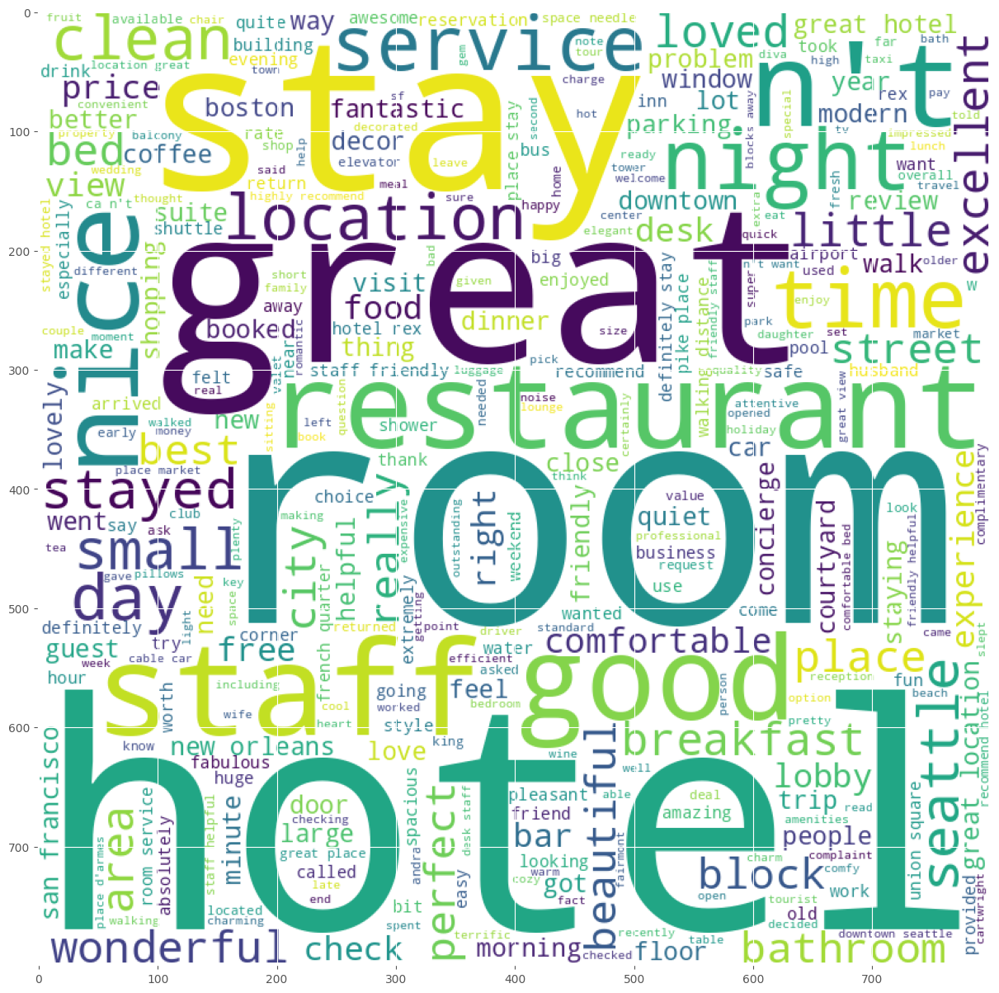

In [27]:
# the frequent  word repeat in the review rating 5

plt.figure(figsize=(15,15))
wc1 = WordCloud(max_words=1000, min_font_size=10,
                height=800,width=800,background_color="white").generate(' '.join(df_5['Review']))

plt.imshow(wc1)

In [103]:
df_4=df2[df2["Rating"]==4]
df_4

,Unnamed: 0,restaurant_id,category,name,description,price,Review,Rating,city,state,...,address,loc_name,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID,Length
0,0,1,Extra Large Pizza,Extra Large Meat Lovers,Whole pie.,15.99 USD,nice hotel expensive parking got good deal sta...,4,Alexander City,AL,...,"4097 U S Highway 280, Alexander City, AL 35010",The Saucy Hen (4097 U. S. HIGHWAY 280),0623b7ac-598d-5016-bdd2-febb44d79b12,32.923880,-85.959650,False,Opens at 11:00 AM,2022-11-09 18:03:43,1,593
7,7,1,Extra Large Pizza,Extra Large Meat Lovers Slice,Slice.,3.99 USD,"excellent staff, housekeeping quality hotel ch...",4,Albertville,AL,...,"Alabama 75, Albertville, AL 35950",Wild Burger (128 AL Hwy 75),adbe7398-b616-5e82-88f1-3abca66679dc,34.261726,-86.229402,False,Opens at 11:00 AM,2022-11-09 18:03:43,8,597
11,11,1,Jumbo Wings,Jumbo Chicken Wings Seven Pieces,No description available,10.99 USD,nice value seattle stayed 4 nights late 2007. ...,4,Albertville,AL,...,"8081 Us 431, Albertville, AL 35950",Huddle House (8081 Highway 431),20e213c5-b57d-590a-ab43-f78d55570a55,34.280890,-86.218930,False,Opens at 6:00 AM,2022-11-09 18:03:43,12,364
12,12,1,Jumbo Wings,Jumbo Chicken Wings Nine Pieces,No description available,12.99 USD,nice hotel good location hotel kimpton design ...,4,Boaz,AL,...,"2263 Us Highway 431, Boaz, AL 35957",Captain D's (2263 US Highway 431),e9973927-8f9e-5058-8a8f-9bf4465dcbc5,34.218060,-86.158700,False,Opens at 10:30 AM,2022-11-09 18:03:43,13,569
14,14,1,Spicy Jumbo Wings,Jumbo Spicy Chicken Wings Five Pieces,No description available,8.99 USD,"great hotel night quick business trip, loved l...",4,Guntersville,AL,...,"12383 U.S. 431, Guntersville, AL 35976",Jessy Tacos Y Tortas,f6490d88-a10e-4a4c-9afd-d8dd3f2a2324,34.304850,-86.287310,False,Opens at 11:00 AM,2022-11-09 18:03:43,15,202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
978,978,21,Shakes - Vanilla,PB Cookie Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,great choice discounted rates available just l...,4,Birmingham,AL,...,"3382 Morgan Dr, Birmingham, AL 35216",Subway (3382 Morgan Dr),d68f2c74-46cf-4069-86a1-9fc8e11627e2,33.426150,-86.773394,False,Available at 9:00 AM,2022-11-09 18:03:43,979,597
979,979,21,Shakes - Vanilla,White Chocolate Pretzel Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,"loved place, clift favorite hotels, modern bou...",4,Fultondale,AL,...,"201 Walker Chapel Rd, Fultondale, AL 35068",Jack's (201 Walker Chapel Rd),95744928-db5e-51b7-ba68-d8dc3248300e,33.610450,-86.798507,False,Available at 6:00 AM,2022-11-09 18:03:43,980,356
989,989,21,Shakes - Fruity,Apple Pie Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",10.5 USD,"nightclub posing 4 star hotel hotel gorgeous, ...",4,Birmingham,AL,...,"1928 Bessemer Road, Birmingham, AL 35208",KFC (1928 Bessemer Road),4095c07b-3471-4551-a7d1-ff058752f68a,33.492144,-86.883373,False,Opens at 11:00 AM,2022-11-09 18:03:43,990,493
996,996,21,Shakes - Fruity,PB Banana Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,good customer service recently wrote dissatisf...,4,3321 Lorna Rd Birmingham AL 35216,3321,...,3321 Lorna Rd Birmingham AL 35216,"Veggie Mania (3321 Lorna Rd, Birmingham, AL 35...",fab0df13-6da0-5223-94d0-ed77210724ee,33.393530,-86.796730,False,Opens at 11:00 AM,2022-11-09 18:03:43,997,498


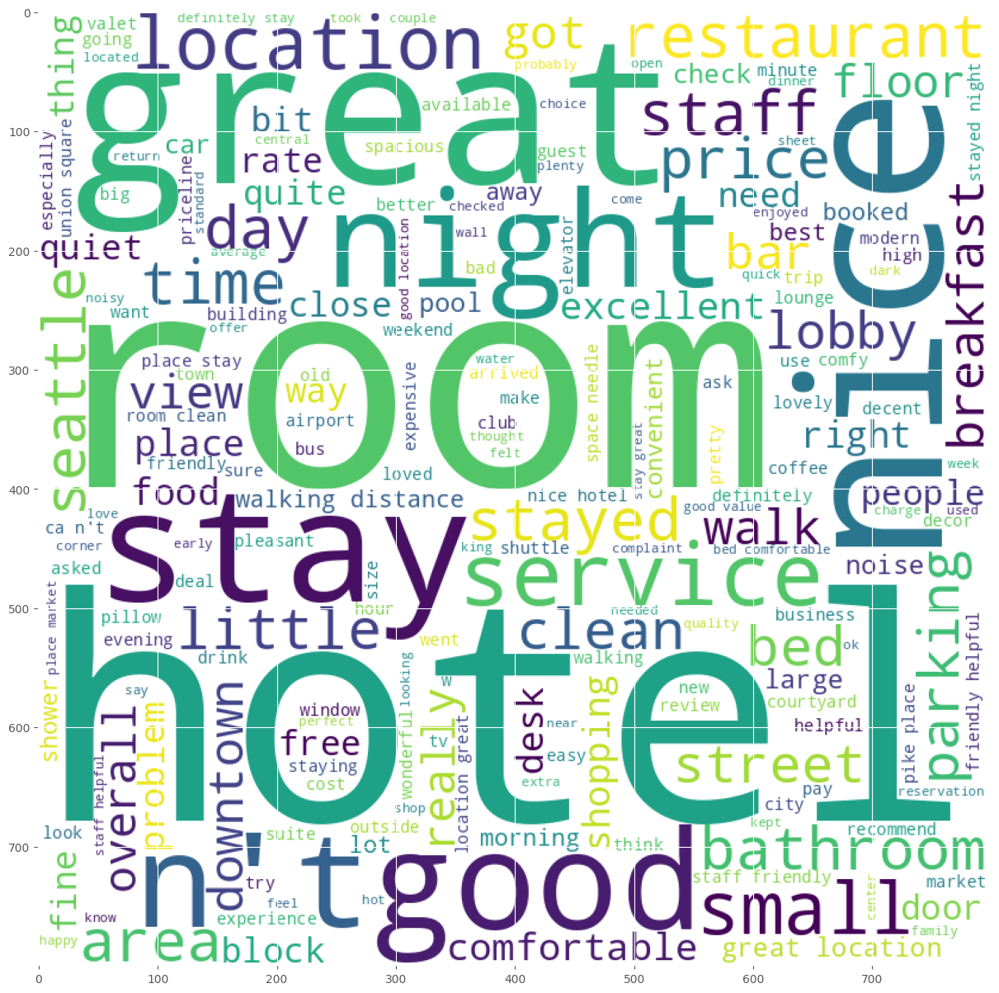

In [30]:
# the frequent words repeat in the review rating 4

plt.figure(figsize=(15,15))
wc2 = WordCloud(max_words=1000, min_font_size=10,
                height=800,width=800,background_color="white").generate(' '.join(df_4['Review']))

plt.imshow(wc2)

##We can see the people satisfy with rating 4 in this words the same rating 5 but plus ...¶
##beautiful hotel - staff friendly - service - street.

In [31]:
df_3=df2[df2["Rating"]==3]
df_3

,Unnamed: 0,restaurant_id,category,name,description,price,Review,Rating,city,state,...,address,loc_name,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID,Length
2,2,1,Extra Large Pizza,Extra Large Pepperoni,Whole pie.,14.99 USD,nice rooms not 4* experience hotel monaco seat...,3,Alexander City,AL,...,"4097 Us Highway 280, Alexander City, AL 35010",MrBeast Burger (4097 US Highway 280),308b1654-60f1-51d4-bfe2-ed7c849442ac,32.923880,-85.959650,False,Opens at 11:00 AM,2022-11-09 18:03:43,3,1427
13,13,1,Jumbo Wings,Jumbo Chicken Wings Twelve Pieces,No description available,15.99 USD,nice hotel not nice staff hotel lovely staff q...,3,Guntersville,AL,...,"3848 Alabama Highway 79 South, Guntersville, A...",Char Burger,c15e2099-0c42-5974-9d56-ce073d69d085,34.315340,-86.334570,False,Opens at 7:30 AM,2022-11-09 18:03:43,14,417
19,19,1,Chicken Tenders,Seven Chicken Tenders,No description available,10.99 USD,hmmmmm say really high hopes hotel monaco chos...,3,Guntersville,AL,...,"Paddle Wheel Drive, Guntersville, AL 35976",Another Broken Egg (2469 Paddlewheel Drive),d00ae689-5032-5dfb-8f7d-0f449c7d5164,34.361690,-86.290840,False,Opens at 7:00 AM,2022-11-09 18:03:43,20,1025
25,25,1,Snacks,Ruffles Cheddar and Sour Cream,2.625oz.,1.99 USD,"n't mind noise place great, read reviews noise...",3,Albertville,AL,...,"8171 Us Highway 431, Albertville, AL 35950",Dunkin' (8171 Us Highway 431),281f7017-04bf-55d9-aa5a-9e2b8eb2529e,34.281240,-86.219970,False,Opens at 5:00 AM,2022-11-09 18:03:43,26,482
27,27,1,Snacks,Cheetos Crunchy,3.5oz.,1.99 USD,met expectations centrally located hotel block...,3,Albertville,AL,...,"6815 Hwy 431 South, Albertville, AL 35950",Pizza Hut (6815 Hwy 431 South),802da8cf-c709-5248-87fc-ec042e3eebbd,34.273010,-86.199660,False,Opens at 10:00 AM,2022-11-09 18:03:43,28,538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,975,21,Shakes - Vanilla,Sugar Cookie Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,cool knew san francisco arrived cool damp room...,3,Hoover,AL,...,"5192 Caldwell Mill Road Ste. 107, Hoover, AL 3...",Marco's Pizza (5192 Caldwell Mill Road),f8755970-e1e8-5b09-b37c-6f9d80fa1180,33.384840,-86.739300,False,Opens at 11:00 AM,2022-11-09 18:03:43,976,384
992,992,21,Shakes - Fruity,Blueberry Cheesecake Shake,"Contains gluten. 200 to 250 calories, 24 to 32...",8.5 USD,"clift rated, clift definitely rated, mentioned...",3,Birmingham,AL,...,"313 Valley Avenue, Birmingham, AL 35209","Darryn's Deli [TAXTECH-889 - Birmingham, AL]",fcc68a35-948b-4992-9841-6453b69ec767,33.470920,-86.823220,False,Currently unavailable,2022-11-09 18:03:43,993,1033
995,995,21,Shakes - Fruity,Cap'n Crunch Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,average price hotel good location 1.5 blocks u...,3,Birmingham,AL,...,"2101 Richard Arrington Jr Blvd S, Birmingham, ...",Walgreens (2101 Richard Arrington Jr Blvd S),9cbad917-b50b-48f6-9a27-8917ec4012a7,33.488530,-86.792370,False,Available at 7:00 AM,2022-11-09 18:03:43,996,138
998,998,21,Shakes - Fruity,Strawberry Banana Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,"business trip ok hotel fine evening business, ...",3,Hoover,AL,...,"3020 John Hawkins Pkwy, Hoover, AL 35244",Chick-fil-A (3020 John Hawkins Pkwy),22f33091-d538-46ce-af4b-2b5ed753d1fd,33.371720,-86.812815,False,Available at 6:00 AM,2022-11-09 18:03:43,999,433


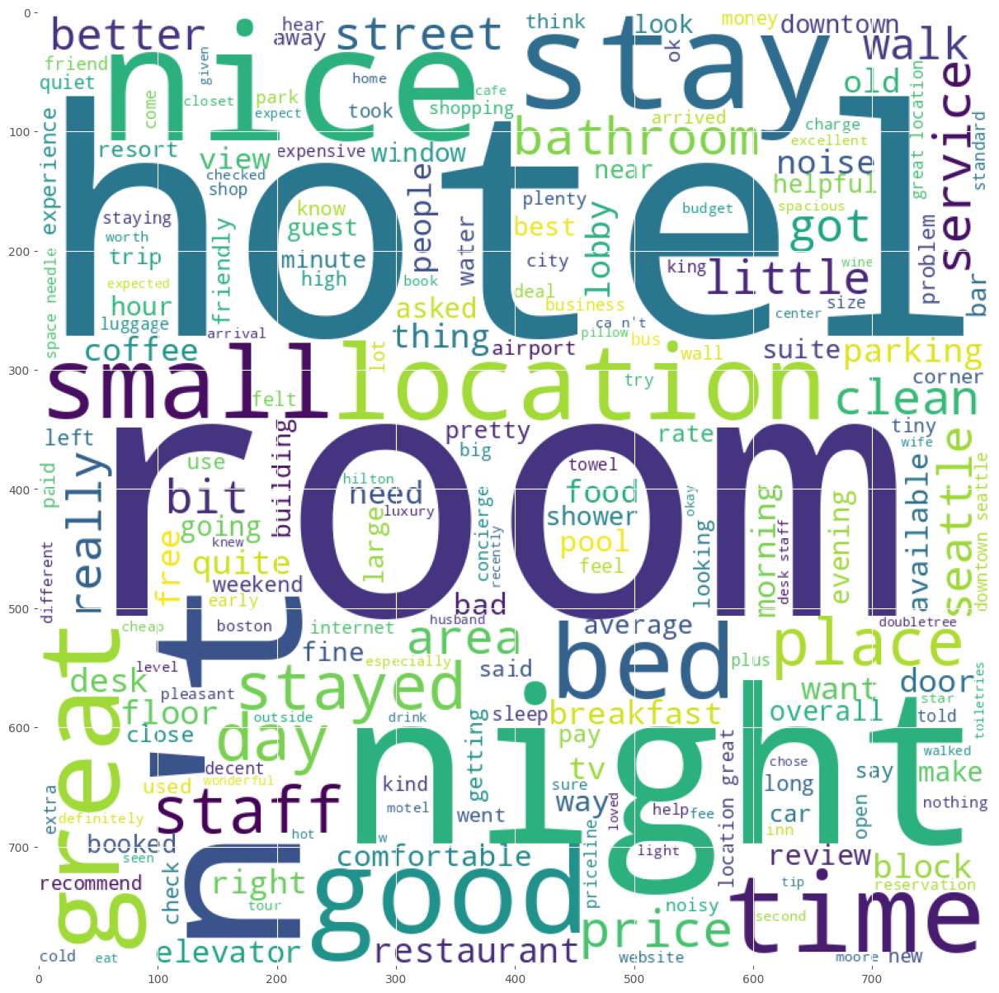

In [32]:

plt.figure(figsize=(15,15))
wc3 = WordCloud(max_words=1000, min_font_size=10,
                height=800,width=800,background_color="white").generate(' '.join(df_3['Review']))

plt.imshow(wc3)

In [33]:
df_2=df2[df2["Rating"]==2]
df_2

,Unnamed: 0,restaurant_id,category,name,description,price,Review,Rating,city,state,...,address,loc_name,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID,Length
1,1,1,Extra Large Pizza,Extra Large Supreme,Whole pie.,15.99 USD,ok nothing special charge diamond member hilto...,2,Albertville,AL,...,"7300 Hwy 431 North, Albertville, AL 35951",Burger King (7300 Hwy 431 North),62a60773-5644-4d73-b969-a4922ce70fa6,34.277260,-86.206110,True,No message available,2022-11-09 18:03:43,2,1689
10,10,1,Jumbo Wings,Jumbo Chicken Wings Five Pieces,No description available,8.99 USD,"poor value stayed monaco seattle july, nice ho...",2,Guntersville,AL,...,"14232 U.S. 431, Guntersville, AL 35976",El Camino Real,aef3fc63-e4ec-5aba-a692-cf971ba3e59f,34.321150,-86.311480,False,Opens at 11:30 AM,2022-11-09 18:03:43,11,333
16,16,1,Spicy Jumbo Wings,Jumbo Spicy Chicken Wings Nine Pieces,No description available,12.99 USD,disappointed say anticipating stay hotel monac...,2,Boaz,AL,...,"10850 Alabama 168, Boaz, AL 35957",Dale's BBQ,684558bc-2b37-4a62-a35c-043a26bf38cd,34.198230,-86.152800,False,Opens at 10:30 AM,2022-11-09 18:03:43,17,1662
24,24,1,Snacks,Lay's Classic,2.75oz.,1.99 USD,great location need internally upgrade advanta...,2,Albertville,AL,...,"7448 Us Hwy 431, Albertville, AL 35950",Arby's (7448 US Hwy 431),f5d17446-186c-5a9a-a658-90ddba697122,34.278130,-86.208330,False,Opens at 10:00 AM,2022-11-09 18:03:43,25,250
33,33,1,Snacks,Wonderful Roasted and Salted Unshelled Pistachios,6oz.,14.99 USD,good location poor cleanliness warwick hotel g...,2,Albertville,AL,...,"203 W Mckinney Ave Suite B, Albertville, AL 35950",Chico's Taqueria,eb06b712-5bf9-4190-bc01-fe9e4f5e999f,34.272750,-86.209230,False,Opens at 11:00 AM,2022-11-09 18:03:43,34,576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
927,927,21,Picked for you,Cherry Limeade,"Cherry, lime, raspberry, and collagen.",10.0 USD,curate egg accepting centrally located elderly...,2,Birmingham,AL,...,"3310 Clairmont Ave S, Birmingham, AL 35222",China Moon,f5559e4d-499a-4785-9789-0e216b354178,33.513080,-86.780760,False,Opens at 11:30 AM,2022-11-09 18:03:43,928,902
958,958,21,Shakes - Our Favs,Peanut Butter Brownie Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,noisy average hotel thought did homework plann...,2,Hoover,AL,...,"103 Inverness Corners, Hoover, AL 35242",Schlotzsky's Deli (Inverness Corners),33797cee-f991-40f1-9f56-e00c85344aeb,33.419013,-86.693856,False,Opens at 10:00 AM,2022-11-09 18:03:43,959,1039
976,976,21,Shakes - Vanilla,Salted Caramel Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,closet sized rooms good location stayed sept 2...,2,Birmingham,AL,...,"7748 Crestwood Boulevard, Birmingham, AL 35210",Jack's (7748 Crestwood Boulevard),252b5ec3-8042-5de4-beb9-ee19a4efa168,33.531290,-86.717560,False,Opens at 6:00 AM,2022-11-09 18:03:43,977,493
977,977,21,Shakes - Vanilla,Matcha Green Tea Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,underwhelming no reason stay stayed clift hote...,2,BIRMINGHAM,AL,...,"3303 Clairmont Plaza South, BIRMINGHAM, AL 35040",CVS (3303 Clairmont Plaza South),908e130a-d048-5371-87d8-41cd4e449cf7,33.512843,-86.779960,False,Available at 8:00 AM,2022-11-09 18:03:43,978,571


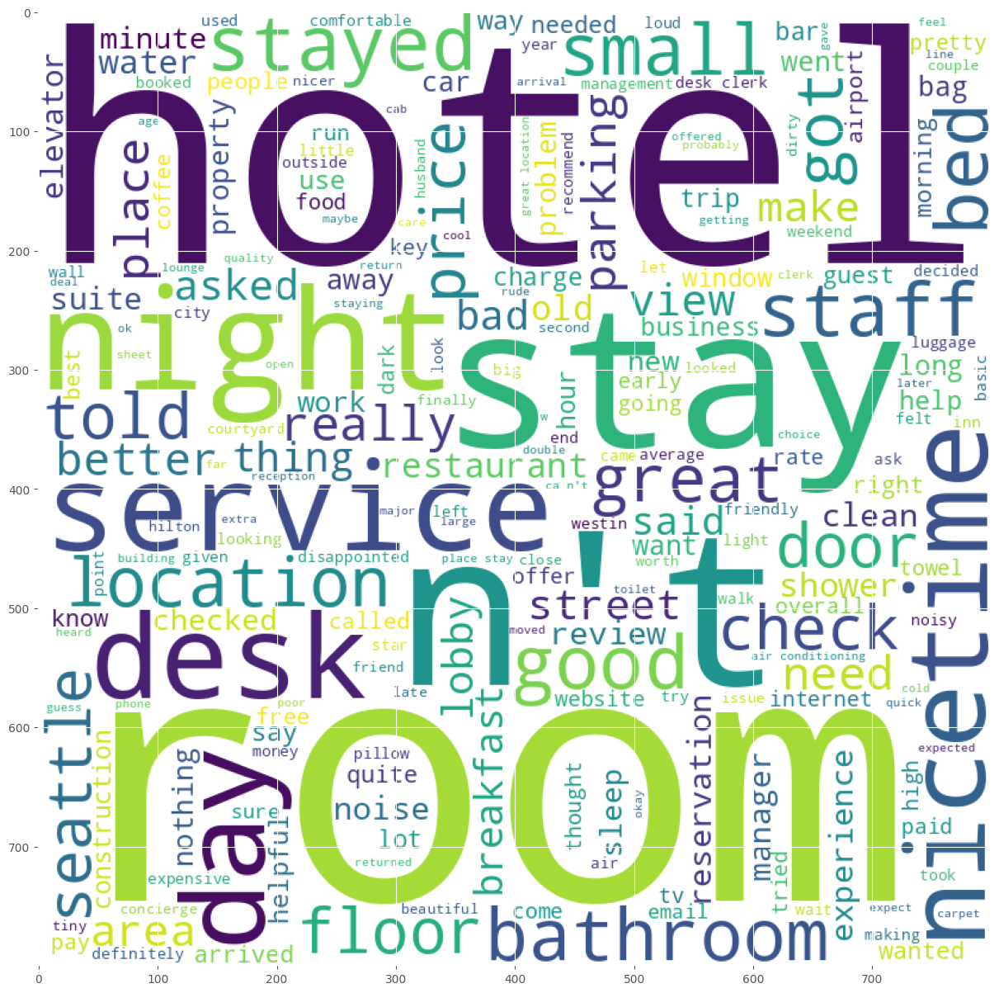

In [34]:
plt.figure(figsize=(15,15))
wc4 = WordCloud(max_words=1000, min_font_size=10,
                height=800,width=800,background_color="white").generate(' '.join(df_2['Review']))

plt.imshow(wc4)

##We see the people unsatisfied = rating 2 in this words the same rating 5 & 4 but plus ...¶
##Hotel - staff - beach - srevice - disk - stay - shower

In [35]:
df_1=df2[df2["Rating"]==1]
df_1

,Unnamed: 0,restaurant_id,category,name,description,price,Review,Rating,city,state,...,address,loc_name,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID,Length
15,15,1,Spicy Jumbo Wings,Jumbo Spicy Chicken Wings Seven Pieces,No description available,10.99 USD,horrible customer service hotel stay february ...,1,Albertville,AL,...,"110 East Main Street, Albertville, AL 35950",Jamoka's Coffee,820c7bff-7300-58b1-9e9e-36ff3b534e32,34.267930,-86.208160,False,Opens at 7:30 AM,2022-11-09 18:03:43,16,1411
32,32,1,Snacks,Wonderful Roasted and Salted Pistachios,8oz.,10.99 USD,"noise airconditioner-a standard, arranged stay...",1,Albertville,AL,...,"7343 Us Highway 431, Albertville, AL 35950",Subway (7343 US Highway 431),b0c7a5a0-c1ee-4ae6-8527-c0b8084be46d,34.276400,-86.207270,False,Opens at 8:00 AM,2022-11-09 18:03:43,33,614
40,40,1,Candy,Haribo Gold Bears,8oz.,2.69 USD,"bad choice, booked hotel hot wire called immed...",1,Oxford,AL,...,"220 Leon Smith Parkway, Oxford, AL 36203",Cracker Barrel Old Country Store (220 Leon Smi...,cabbf4f3-dc08-43c9-9f1a-5965b278c7b4,33.612588,-85.787230,False,Opens at 7:30 AM,2022-11-09 18:03:43,41,861
65,65,1,Energy,Red Bull,12oz can.,3.79 USD,"hated inn terrible, room-service horrible staf...",1,Arab,AL,...,"1264 North Brindel Parkway, Arab, AL 35016",Taco Bell (1264 North Brindel Parkway),08efb07a-9266-54c3-8d08-f6428a59c5e6,34.338600,-86.503420,False,Available at 9:00 AM,2022-11-09 18:03:43,66,133
69,69,1,Juice,Tropicana Orange No Pulp,12oz.,2.29 USD,ace grunge lives does mold mildew tiny bed met...,1,Anniston,AL,...,"2109 Quintard Ave, Anniston, AL 36201",Pizza Hut (2109 Quintard Ave),3f80fdf0-b24e-56e1-9f3f-f9ce595b65e9,33.672120,-85.826390,False,Opens at 10:30 AM,2022-11-09 18:03:43,70,84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983,983,21,Shakes - Vanilla,White Chocolate Snickers Shake,"Contains gluten. 200 to 250 calories, 24 to 32...",8.5 USD,lost reservation staff not apologetic case hot...,1,Birmingham,AL,...,"601 Doug Baker Blvd, 101, Birmingham, AL 35242",Sushi Village (Doug Baker Blvd),4a068e4f-7028-4afa-9942-63b103921143,33.408230,-86.669240,False,Opens at 11:00 AM,2022-11-09 18:03:43,984,773
984,984,21,Shakes - Vanilla,White Chocolate Reese's Shake,"Contains gluten. 200 to 250 calories, 24 to 32...",8.5 USD,"ew, yuck, zero star review option, recommended...",1,Birmingham,AL,...,"5361 U.S. 280, Birmingham, AL 35242",Big Bad Breakfast (5361 US 280),5104df2a-e9ef-43eb-b0eb-2f5ed05bdffa,33.420583,-86.674028,False,Opens at 7:05 AM,2022-11-09 18:03:43,985,681
985,985,21,Shakes - Vanilla,Almond Cookie Shake,"Contains gluten. 200 to 250 calories, 24 to 32...",8.5 USD,"worst hotel experience, stayed number shraeger...",1,Birmingham,AL,...,"3270 Morrow Rd, Birmingham, AL 35235",Zaxby's (3270 Morrow Rd),71e38107-bf6a-5ede-8361-0f3acfdd0fbd,33.597870,-86.646050,False,Available at 10:30 AM,2022-11-09 18:03:43,986,1819
988,988,21,Shakes - Fruity,Lemon Blueberry Shake,"200 to 250 calories, 24 to 32 grams protein, 1...",8.5 USD,avoid clift hotel clift hotel worst place stay...,1,Hoover,AL,...,"2000 Galleria Circle Space No F, Hoover, AL 35244",Popeyes (2000 Galleria Circle Space No F),93791013-7e3f-5285-b7f6-bc3d52f9e23d,33.380220,-86.807090,False,Opens at 11:30 AM,2022-11-09 18:03:43,989,440


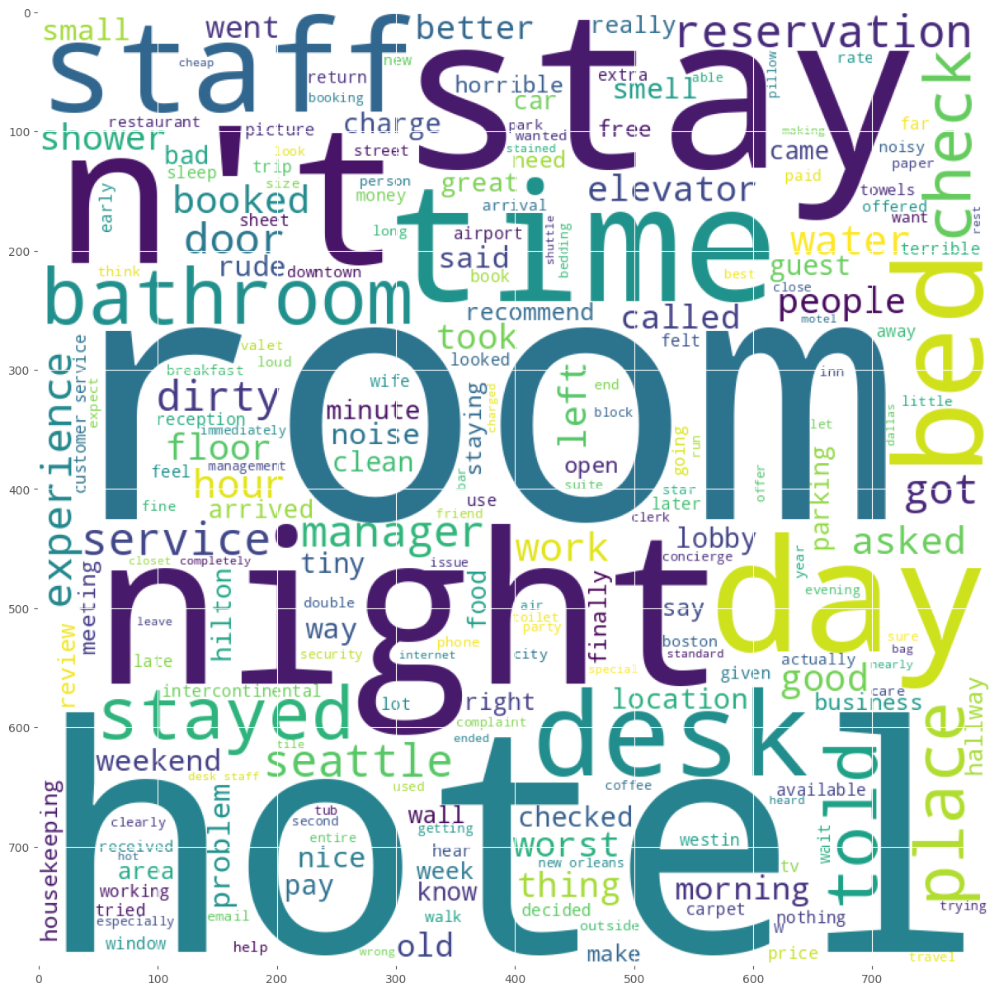

In [36]:
plt.figure(figsize=(15,15))
wc5 = WordCloud(max_words=1000, min_font_size=10,
                height=800,width=800,background_color="white").generate(' '.join(df_1['Review']))

plt.imshow(wc5)

##We see the people unsatisfied = rating 1 in this words the same rating 5 & 4 but plus ...¶
##room - hotel - place - staff - door - check in - sleep - toilet - resort -water.

In [48]:
print(df2['Rating'].value_counts(normalize=False))

Rating
5    334
4    311
3    137
1    110
2    108
Name: count, dtype: int64


In [42]:

# Calculate the percentage of each rating
rating_counts = df2['Rating'].value_counts(normalize=True) * 100
rating_counts


,proportion
Rating,
5,33.4
4,31.1
3,13.7
1,11.0
2,10.8


In [41]:
# The percentage rating in the data set, showing each segment analyse

import plotly.express as px

# Calculate the percentage of each rating
rating_counts = df2['Rating'].value_counts(normalize=True) * 100

# Create the pie chart using plotly
fig = px.pie(values=rating_counts.values,
             names=rating_counts.index,
             title='Percentage Distribution of Ratings',
             color_discrete_sequence=px.colors.sequential.RdBu, # Use a colorful sequence
             hole=0.3) # Add a hole in the middle

fig.update_traces(textinfo='percent+label', textposition='inside')
fig.show()


#Making clean text

In [52]:

for i in range(len(df2.columns)):
  print(f"Column index {i}: {df2.columns[i]}")




Column index 0: Unnamed: 0
Column index 1: restaurant_id
Column index 2: category
Column index 3: name
Column index 4: description
Column index 5: price
Column index 6: Review
Column index 7: Rating
Column index 8: city
Column index 9: state
Column index 10: zipcode
Column index 11: address
Column index 12: loc_name
Column index 13: loc_number
Column index 14: latitude
Column index 15: longitude
Column index 16: is_open
Column index 17: closed_message
Column index 18: scan_date
Column index 19: TID
Column index 20: Length


In [55]:
# first review
a=df2.iloc[0,6]
print(a)

nice hotel expensive parking got good deal stay hotel anniversary, arrived late evening took advice previous reviews did valet parking, check quick easy, little disappointed non-existent view room room clean nice size, bed comfortable woke stiff neck high pillows, not soundproof like heard music room night morning loud bangs doors opening closing hear people talking hallway, maybe just noisy neighbors, aveda bath products nice, did not goldfish stay nice touch taken advantage staying longer, location great walking distance shopping, overall nice experience having pay 40 parking night,  


In [56]:
# import library for Natural Language Toolkit

import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

In [57]:
# remove any symbol and cover letter to lowercase

a=re.sub('[^a-zA-Z0-9]',' ',a)
a=a.lower().split()
#a=[word for word in a if not word in set(stopwords.words('english'))]
a

['nice',
 'hotel',
 'expensive',
 'parking',
 'got',
 'good',
 'deal',
 'stay',
 'hotel',
 'anniversary',
 'arrived',
 'late',
 'evening',
 'took',
 'advice',
 'previous',
 'reviews',
 'did',
 'valet',
 'parking',
 'check',
 'quick',
 'easy',
 'little',
 'disappointed',
 'non',
 'existent',
 'view',
 'room',
 'room',
 'clean',
 'nice',
 'size',
 'bed',
 'comfortable',
 'woke',
 'stiff',
 'neck',
 'high',
 'pillows',
 'not',
 'soundproof',
 'like',
 'heard',
 'music',
 'room',
 'night',
 'morning',
 'loud',
 'bangs',
 'doors',
 'opening',
 'closing',
 'hear',
 'people',
 'talking',
 'hallway',
 'maybe',
 'just',
 'noisy',
 'neighbors',
 'aveda',
 'bath',
 'products',
 'nice',
 'did',
 'not',
 'goldfish',
 'stay',
 'nice',
 'touch',
 'taken',
 'advantage',
 'staying',
 'longer',
 'location',
 'great',
 'walking',
 'distance',
 'shopping',
 'overall',
 'nice',
 'experience',
 'having',
 'pay',
 '40',
 'parking',
 'night']

In [58]:
# dowmload the stopword from nlit library
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [59]:
# show what the stopwords

sw=set(stopwords.words('english'))
print(sw)

{'these', 'above', 'below', 'theirs', 's', 'ma', "don't", 'whom', 'yours', 'no', 'having', 'it', 'were', 'down', 'under', 'how', 'is', 'y', 'my', 'should', "aren't", 'why', "she's", 'or', "it's", 'them', 'by', 'then', 'needn', "didn't", 'some', 'same', 'during', 'ours', "won't", 'are', 'an', 'until', 'd', 'to', 'mustn', 'weren', 'through', 'which', "hasn't", 'own', 'i', 'that', 'where', 'will', 'very', 'been', 'hasn', 'itself', 'for', 'when', 'o', "mustn't", 'shan', 't', 'doing', 're', "couldn't", 've', 'me', 'isn', 'being', 'you', 'because', 'while', 'as', 'did', 'both', 'can', 'over', 'didn', 'won', 'had', 'few', 'wouldn', 'its', 'be', 'there', "doesn't", "mightn't", "you'll", "wouldn't", 'so', 'aren', 'just', 'haven', 'am', 'in', 'once', 'only', 'too', 'our', 'she', 'out', 'herself', 'into', 'was', 'up', 'all', 'each', "weren't", "you've", 'have', 'nor', 'couldn', "that'll", 'themselves', 'what', 'this', 'again', "hadn't", 'm', 'and', 'yourselves', 'before', 'your', "haven't", 'who'

In [60]:
# made loop for clean reviews - based on the stopwords

clean_word=[i for i in a if not i in sw]
clean_word

['nice',
 'hotel',
 'expensive',
 'parking',
 'got',
 'good',
 'deal',
 'stay',
 'hotel',
 'anniversary',
 'arrived',
 'late',
 'evening',
 'took',
 'advice',
 'previous',
 'reviews',
 'valet',
 'parking',
 'check',
 'quick',
 'easy',
 'little',
 'disappointed',
 'non',
 'existent',
 'view',
 'room',
 'room',
 'clean',
 'nice',
 'size',
 'bed',
 'comfortable',
 'woke',
 'stiff',
 'neck',
 'high',
 'pillows',
 'soundproof',
 'like',
 'heard',
 'music',
 'room',
 'night',
 'morning',
 'loud',
 'bangs',
 'doors',
 'opening',
 'closing',
 'hear',
 'people',
 'talking',
 'hallway',
 'maybe',
 'noisy',
 'neighbors',
 'aveda',
 'bath',
 'products',
 'nice',
 'goldfish',
 'stay',
 'nice',
 'touch',
 'taken',
 'advantage',
 'staying',
 'longer',
 'location',
 'great',
 'walking',
 'distance',
 'shopping',
 'overall',
 'nice',
 'experience',
 'pay',
 '40',
 'parking',
 'night']

In [61]:
# now make sentence - list
sen=' '.join(clean_word)
sen

'nice hotel expensive parking got good deal stay hotel anniversary arrived late evening took advice previous reviews valet parking check quick easy little disappointed non existent view room room clean nice size bed comfortable woke stiff neck high pillows soundproof like heard music room night morning loud bangs doors opening closing hear people talking hallway maybe noisy neighbors aveda bath products nice goldfish stay nice touch taken advantage staying longer location great walking distance shopping overall nice experience pay 40 parking night'

In [62]:
# defined function for clean all reviews in the data set


def text_preprocessing(a):
  a=re.sub('[^a-zA-Z]',' ',a)
  a=a.lower().split()
  ps=PorterStemmer()
  clean_word=[ps.stem(i) for i in a if not i in sw]
  sen=' '.join(clean_word)
  return sen

In [ ]:

#def preprocess_text(text):
  #  text = text.lower()  # Convert to lowercase
  # text = re.sub(r'\s+', ' ', text)  # Remove extra spaces
   # tokens = word_tokenize(text)  # Tokenization
    #tokens = [word for word in tokens if word not in stopwords.words('english')]  # Remove stopwords
   # return ' '.join(tokens)


In [107]:
# add new column about the reviews after cleaning

df2['clean_word']=df2["Review"].apply(text_preprocessing)
df2.head()

,Unnamed: 0,restaurant_id,category,name,description,price,Review,Rating,city,state,...,loc_name,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID,Length,clean_word
0,0,1,Extra Large Pizza,Extra Large Meat Lovers,Whole pie.,15.99 USD,nice hotel expensive parking got good deal sta...,4,Alexander City,AL,...,The Saucy Hen (4097 U. S. HIGHWAY 280),0623b7ac-598d-5016-bdd2-febb44d79b12,32.923880,-85.95965,False,Opens at 11:00 AM,2022-11-09 18:03:43,1,593,nice hotel expens park got good deal stay hote...
1,1,1,Extra Large Pizza,Extra Large Supreme,Whole pie.,15.99 USD,ok nothing special charge diamond member hilto...,2,Albertville,AL,...,Burger King (7300 Hwy 431 North),62a60773-5644-4d73-b969-a4922ce70fa6,34.277260,-86.20611,True,No message available,2022-11-09 18:03:43,2,1689,ok noth special charg diamond member hilton de...
2,2,1,Extra Large Pizza,Extra Large Pepperoni,Whole pie.,14.99 USD,nice rooms not 4* experience hotel monaco seat...,3,Alexander City,AL,...,MrBeast Burger (4097 US Highway 280),308b1654-60f1-51d4-bfe2-ed7c849442ac,32.923880,-85.95965,False,Opens at 11:00 AM,2022-11-09 18:03:43,3,1427,nice room experi hotel monaco seattl good hote...
3,3,1,Extra Large Pizza,Extra Large BBQ Chicken &amp; Bacon,Whole Pie,15.99 USD,"unique, great stay, wonderful time hotel monac...",5,Albertville,AL,...,Taco Bell (7959 Us Highway 431),ef86513f-3973-4315-b938-bb6f230c5c58,34.280000,-86.21703,True,No message available,2022-11-09 18:03:43,4,600,uniqu great stay wonder time hotel monaco loca...
4,4,1,Extra Large Pizza,Extra Large 5 Cheese,Whole pie.,14.99 USD,"great stay great stay, went seahawk game aweso...",5,Alexander City,AL,...,The Station,9507eb1b-5afc-4ee1-a566-526d9e2ba2d0,32.956127,-85.94433,False,Opens at 11:00 AM,2022-11-09 18:03:43,5,1281,great stay great stay went seahawk game awesom...


In [109]:
# Length of word in sentence
df2['Length 2'] = df2['clean_word'].apply(len)
df2.head(5)

,Unnamed: 0,restaurant_id,category,name,description,price,Review,Rating,city,state,...,loc_number,latitude,longitude,is_open,closed_message,scan_date,TID,Length,clean_word,Length 2
0,0,1,Extra Large Pizza,Extra Large Meat Lovers,Whole pie.,15.99 USD,nice hotel expensive parking got good deal sta...,4,Alexander City,AL,...,0623b7ac-598d-5016-bdd2-febb44d79b12,32.923880,-85.95965,False,Opens at 11:00 AM,2022-11-09 18:03:43,1,593,nice hotel expens park got good deal stay hote...,481
1,1,1,Extra Large Pizza,Extra Large Supreme,Whole pie.,15.99 USD,ok nothing special charge diamond member hilto...,2,Albertville,AL,...,62a60773-5644-4d73-b969-a4922ce70fa6,34.277260,-86.20611,True,No message available,2022-11-09 18:03:43,2,1689,ok noth special charg diamond member hilton de...,1407
2,2,1,Extra Large Pizza,Extra Large Pepperoni,Whole pie.,14.99 USD,nice rooms not 4* experience hotel monaco seat...,3,Alexander City,AL,...,308b1654-60f1-51d4-bfe2-ed7c849442ac,32.923880,-85.95965,False,Opens at 11:00 AM,2022-11-09 18:03:43,3,1427,nice room experi hotel monaco seattl good hote...,1174
3,3,1,Extra Large Pizza,Extra Large BBQ Chicken &amp; Bacon,Whole Pie,15.99 USD,"unique, great stay, wonderful time hotel monac...",5,Albertville,AL,...,ef86513f-3973-4315-b938-bb6f230c5c58,34.280000,-86.21703,True,No message available,2022-11-09 18:03:43,4,600,uniqu great stay wonder time hotel monaco loca...,506
4,4,1,Extra Large Pizza,Extra Large 5 Cheese,Whole pie.,14.99 USD,"great stay great stay, went seahawk game aweso...",5,Alexander City,AL,...,9507eb1b-5afc-4ee1-a566-526d9e2ba2d0,32.956127,-85.94433,False,Opens at 11:00 AM,2022-11-09 18:03:43,5,1281,great stay great stay went seahawk game awesom...,1058


In [69]:
df2.describe().round(2)

,Unnamed: 0,restaurant_id,Rating,latitude,longitude,TID,Length,Length 2
count,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00
mean,499.50,10.52,3.65,33.33,-86.63,500.50,585.98,482.73
std,288.82,6.25,1.33,0.74,0.47,288.82,417.95,343.06
min,0.00,1.00,1.00,30.40,-88.25,1.00,47.00,37.00
25%,249.75,5.00,3.00,33.38,-86.82,250.75,316.75,262.00
50%,499.50,11.00,4.00,33.48,-86.79,500.50,474.00,388.50
75%,749.25,14.00,5.00,33.56,-86.65,750.25,748.25,611.25
max,999.00,21.00,5.00,34.99,-85.24,1000.00,4599.00,3802.00


##We can see the new length2 reviews word count is less compare to length

In [104]:
#Importing the basic librarires for building model - classification

from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score,r2_score


from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import  KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import  MLPClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import MultinomialNB

from sklearn.feature_extraction.text import CountVectorizer

from sklearn.preprocessing import LabelEncoder,StandardScaler

In [110]:
df2['clean_word'].head(5)

,clean_word
0,nice hotel expens park got good deal stay hote...
1,ok noth special charg diamond member hilton de...
2,nice room experi hotel monaco seattl good hote...
3,uniqu great stay wonder time hotel monaco loca...
4,great stay great stay went seahawk game awesom...


In [111]:
# now we need change the new word to number - array using CountVectorizer

cv=CountVectorizer()
X=cv.fit_transform(df2["clean_word"]).toarray()
y=df["Rating"]

In [113]:
print(X)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [114]:
# the shape
print("X shape: ", X.shape)
print("y: shape ", y.shape)

X shape:  (1000, 6118)
y: shape  (1000,)


In [115]:
# split the data train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print("X Train : ", X_train.shape)
print("X Test  : ", X_test.shape)
print("Y Train : ", y_train.shape)
print("Y Test  : ", y_test.shape)

X Train :  (750, 6118)
X Test  :  (250, 6118)
Y Train :  (750,)
Y Test  :  (250,)


In [116]:
#Defined object from library classification

LR = LogisticRegression()
DTR = DecisionTreeClassifier()
RFR = RandomForestClassifier()
KNR = KNeighborsClassifier()
NB = MultinomialNB()

In [117]:
# make for loop for classification

li = [LR,DTR,RFR,KNR,NB]
d = {}
for i in li:
    i.fit(X_train,y_train)
    ypred = i.predict(X_test)
    print(i,":",accuracy_score(y_test,ypred)*100)
    d.update({str(i):i.score(X_test,y_test)*100})

LogisticRegression() : 50.4
DecisionTreeClassifier() : 36.4
RandomForestClassifier() : 43.6
KNeighborsClassifier() : 34.4
MultinomialNB() : 50.0


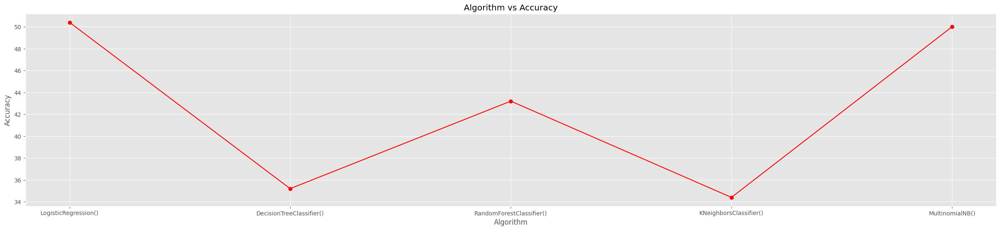

In [80]:
# make graph about Accuracy

plt.figure(figsize=(30, 6))
plt.title("Algorithm vs Accuracy")
plt.xlabel("Algorithm")
plt.ylabel("Accuracy")
plt.plot(d.keys(),d.values(),marker='o',color='red')
plt.show()

##Build DNN Algorithm for Sentimentant analysis/ TensorFlow

In [118]:
#Importing the basic librarires for Build DNN Algorithm for Sentimentant analysis / TensorFlow

import tensorflow as tf
from tensorflow import keras

###Ref for further development: users be careful about potential issues or best practices related to the use of the Dense layer, such as shape mismatches, deprecated parameters, or performance considerations. To resolve the warning, you should review the Keras documentation or the warning message specifics for guidance.

In [119]:
#build model

model=keras.Sequential()
model.add(keras.layers.Dense(512,input_dim=X_train.shape[1],activation=tf.nn.sigmoid)) # Change input_dim to match X_train
model.add(keras.layers.Dense(128,activation=tf.nn.sigmoid))
model.add(keras.layers.Dense(1,activation=tf.nn.sigmoid))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [128]:
#model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
##model.fit(X_train,y_train,epochs=25,batch_size=32,validation_data=(X_test,y_test))
#model.evaluate(x_test,y_test)

Epoch 1/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.1105 - loss: -268.3458 - val_accuracy: 0.1240 - val_loss: -262.1925
Epoch 2/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.1060 - loss: -278.3363 - val_accuracy: 0.1240 - val_loss: -267.3526
Epoch 3/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.0973 - loss: -284.4081 - val_accuracy: 0.1240 - val_loss: -272.4924
Epoch 4/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - accuracy: 0.0969 - loss: -287.1461 - val_accuracy: 0.1240 - val_loss: -277.8981
Epoch 5/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.1033 - loss: -292.6019 - val_accuracy: 0.1240 - val_loss: -283.1993
Epoch 6/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.1016 - loss: -302.0117 - val_accuracy: 0.1240 - val_loss: -289.5551
Epoch 7/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.1108 - loss: -303.3403 - val_accuracy: 0.1240 - val_loss: -295.6164
Epoch 8/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.0974

NameError: name 'x_test' is not defined

In [130]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer()
# Assuming 'Review' column contains the text reviews:
X2 = tfidf_vectorizer.fit_transform(df2["clean_word"])

In [132]:
print(X2)

  (0, 3540)	0.2809912371404115
  (0, 2601)	0.06801004891688939
  (0, 1903)	0.108505349398267
  (0, 3828)	0.2132005579072306
  (0, 2326)	0.07873929424556078
  (0, 2320)	0.057648831826860786
  (0, 1375)	0.10126379038110771
  (0, 5121)	0.10968723720609351
  (0, 204)	0.15184494318775035
  (0, 287)	0.08428737324053763
  (0, 2983)	0.10673157493503121
  (0, 1843)	0.10162174202091902
  (0, 5497)	0.09854981060214202
  (0, 79)	0.15184494318775035
  (0, 4096)	0.1246305308412473
  (0, 4469)	0.08275022286581334
  (0, 5783)	0.10162174202091902
  (0, 901)	0.07094238273830819
  (0, 4208)	0.1157469084154263
  (0, 1696)	0.09636819441262957
  (0, 3090)	0.07395073111713223
  (0, 1518)	0.10272307619515711
  (0, 3571)	0.12159459535026279
  (0, 1891)	0.16797012463073066
  (0, 5839)	0.07873929424556078
  :	:
  (999, 2109)	0.08960841086418964
  (999, 1454)	0.1338329246719862
  (999, 4914)	0.06920922502065557
  (999, 2062)	0.12268682098087424
  (999, 1620)	0.2759295473055429
  (999, 3669)	0.278187049348972
  (9

In [133]:
#  test and train with x2; Term Frequency- Inverse Document Frequency weights

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

# Split data into training and testing sets
X2_train, X2_test, y_train, y_test = train_test_split(X2, y, test_size=0.25, random_state=42)


# Example with Logistic Regression:

from sklearn.linear_model import LogisticRegression
lr_model = LogisticRegression()
lr_model.fit(X2_train, y_train)
lr_predictions = lr_model.predict(X2_test)


from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, lr_predictions)
print(f"Accuracy with TF-IDF features: {accuracy}")




Accuracy with TF-IDF features: 0.48


##Accuracy with TF-IDF features: 0.48

In [136]:
model=keras.Sequential()
model.add(keras.layers.Dense(512,input_dim=X2_train.shape[1],activation=tf.nn.sigmoid)) # Change input_dim to match X_train
model.add(keras.layers.Dense(128,activation=tf.nn.sigmoid))
model.add(keras.layers.Dense(1,activation=tf.nn.sigmoid))

In [137]:
from keras.losses import CategoricalCrossentropy
loss = CategoricalCrossentropy()

In [139]:
model.compile(optimizer='adam',loss='CategoricalCrossentropy',metrics=['accuracy'])
model.fit(X2_train,y_train,epochs=25,batch_size=32,validation_data=(X2_test,y_test))
model.evaluate(x2_test,y_test)

Epoch 1/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.1074 - loss: 4.4489e-07 - val_accuracy: 0.1240 - val_loss: 4.2391e-07
Epoch 2/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - accuracy: 0.1049 - loss: 4.4392e-07 - val_accuracy: 0.1240 - val_loss: 4.2391e-07
Epoch 3/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 0.1052 - loss: 4.4890e-07 - val_accuracy: 0.1240 - val_loss: 4.2391e-07
Epoch 4/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.1002 - loss: 4.4009e-07 - val_accuracy: 0.1240 - val_loss: 4.2391e-07
Epoch 5/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.1121 - loss: 4.3908e-07 - val_accuracy: 0.1240 - val_loss: 4.2391e-07
Epoch 6/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - accuracy: 0.0979 - loss: 4.3649e-07 - val_accuracy: 0.1240 - val_loss: 4.2391e-07
Epoch 7/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - accuracy: 0.1063 - loss: 4.3971e-07 - val_accuracy: 0.1240 - val_loss: 4.2391e-07
Epoch 8/25
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - ac

NameError: name 'x2_test' is not defined

In [121]:
# Sentiment Analysis using VADER

# Install VADER if not already installed
!pip install vaderSentiment

# Import necessary libraries (already imported in your code, but included here for completeness)
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Download lexicon if not already downloaded
nltk.download('vader_lexicon')

# Initialize VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to perform sentiment analysis on a given text
def analyze_sentiment(text):
    scores = analyzer.polarity_scores(text)
    return scores

df2['Sentiment'] = df2['Review'].apply(lambda x: analyze_sentiment(str(x)))

# Example to extract compound sentiment score
df2['Compound_Score'] = df2['Sentiment'].apply(lambda x: x['compound'])


# Example to show the results:
print(df2[['Review', 'Sentiment', 'Compound_Score']].head())


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


                                              Review  \
0  nice hotel expensive parking got good deal sta...   
1  ok nothing special charge diamond member hilto...   
2  nice rooms not 4* experience hotel monaco seat...   
3  unique, great stay, wonderful time hotel monac...   
4  great stay great stay, went seahawk game aweso...   

                                           Sentiment  Compound_Score  
0  {'neg': 0.072, 'neu': 0.643, 'pos': 0.285, 'co...          0.9747  
1  {'neg': 0.11, 'neu': 0.701, 'pos': 0.189, 'com...          0.9787  
2  {'neg': 0.081, 'neu': 0.7, 'pos': 0.219, 'comp...          0.9889  
3  {'neg': 0.06, 'neu': 0.555, 'pos': 0.385, 'com...          0.9912  
4  {'neg': 0.135, 'neu': 0.643, 'pos': 0.221, 'co...          0.9797  


In [ ]:
# sentimental analysis on Review column

analyzer = SentimentIntensityAnalyzer()

df['sentiment_scores'] = df['Review'].apply(lambda review: analyzer.polarity_scores(str(review)))

df['compound_sentiment'] = df['sentiment_scores'].apply(lambda score_dict: score_dict['compound'])

df['sentiment_label'] = df['compound_sentiment'].apply(lambda score: 'positive' if score >= 0.05 else ('negative' if score <= -0.05 else 'neutral'))

print(df[['Review', 'sentiment_scores', 'compound_sentiment', 'sentiment_label']].head(25))


                                               Review  \
0   nice hotel expensive parking got good deal sta...   
1   ok nothing special charge diamond member hilto...   
2   nice rooms not 4* experience hotel monaco seat...   
3   unique, great stay, wonderful time hotel monac...   
4   great stay great stay, went seahawk game aweso...   
5   love monaco staff husband stayed hotel crazy w...   
6   cozy stay rainy city, husband spent 7 nights m...   
7   excellent staff, housekeeping quality hotel ch...   
8   hotel stayed hotel monaco cruise, rooms genero...   
9   excellent stayed hotel monaco past w/e delight...   
10  poor value stayed monaco seattle july, nice ho...   
11  nice value seattle stayed 4 nights late 2007. ...   
12  nice hotel good location hotel kimpton design ...   
13  nice hotel not nice staff hotel lovely staff q...   
14  great hotel night quick business trip, loved l...   
15  horrible customer service hotel stay february ...   
16  disappointed say anticipati

In [124]:
!pip install textblob

In [125]:
from textblob import TextBlob

def analyze_sentiment_textblob(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity  # Polarity ranges from -1 to 1

df2['TextBlob_Sentiment'] = df2['Review'].apply(analyze_sentiment_textblob)

In [126]:
!pip install flair

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 25.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.6/202.6 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 72.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [127]:
from flair.models import TextClassifier
from flair.data import Sentence

classifier = TextClassifier.load('en-sentiment')

def analyze_sentiment_flair(text):
    sentence = Sentence(text)
    classifier.predict(sentence)
    label = sentence.labels[0]  # Get the predicted label (POSITIVE/NEGATIVE)
    score = label.score  # Get the confidence score
    return label.value, score  # Return label and score

df2[['Flair_Sentiment_Label', 'Flair_Sentiment_Score']] = df2['Review'].apply(lambda x: pd.Series(analyze_sentiment_flair(str(x))))

2025-02-12 12:12:18,849 https://nlp.informatik.hu-berlin.de/resources/models/sentiment-curated-distilbert/sentiment-en-mix-distillbert_4.pt not found in cache, downloading to /tmp/tmpil3n1_0l


100%|██████████| 253M/253M [00:14<00:00, 18.7MB/s]

2025-02-12 12:12:33,109 copying /tmp/tmpil3n1_0l to cache at /root/.flair/models/sentiment-en-mix-distillbert_4.pt


2025-02-12 12:12:33,754 removing temp file /tmp/tmpil3n1_0l


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]